In [1]:
pip install tensorflow tensorflow-datasets matplotlib opencv-python-headless

In [2]:
!pip install tf_slim
!git clone https://github.com/tensorflow/models.git
%cd models/research
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

fatal: destination path 'models' already exists and is not an empty directory.
/content/models/research
Processing /content/models/research
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.6/62.6 kB 1.8 MB/s eta 0:00:00
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1697356 sha256=d9de7ef50f3059cf005163cbb7d93780907f11af72d9cae98412408fdc239829
  Stored in directory: /tmp/pip-ephem-wheel-cache-g_0wu2n5/wheels/53/dd/70/2de274d6c443c69d367bd6a5606f95e5a6df61aacf1435ec0d
Successfully built object-detection
  Attempting uninstall: requests
    Found existing installation: requests 2.32.3
    Uninstalling requests-2.32.3:
      Successfully uninstalled requests-2.32.3
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [3]:
# Clone the YOLOv5 repository and install dependencies
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/models/research/yolov5
  Using cached requests-2.32.3-py3-none-any.whl (64 kB)
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
apache-beam 2.57.0 requires requests!=2.32.*,<3.0.0,>=2.24.0, but you have requests 2.32.3 which is incompatible.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.


In [4]:
!pip install .

Processing /content/models/research/yolov5
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [5]:
# !git clone https://github.com/WongKinYiu/yolov7  # Clone YOLOv7 repository
# %cd yolov7
# !pip install -r requirements.txt  # Install required libraries
# !pwd

In [6]:
!pip uninstall keras -y

Found existing installation: keras 3.4.1
Uninstalling keras-3.4.1:
  Successfully uninstalled keras-3.4.1


In [7]:
pip install tensorflow tensorflow-datasets matplotlib opencv-python-headless

  Using cached keras-3.4.1-py3-none-any.whl (1.1 MB)


In [8]:
import tensorflow as tf
print(tf.__version__)

2.16.2


In [9]:
!pip install opendatasets

In [10]:
!pip install numpy opencv-python Pillow

In [11]:
#import opendatasets as od
#import cv2
#import imghdr
#import tensorflow
#import os
#import numpy as np
#import keras
#from keras import layers
#from tensorflow import data as tf_data
#import matplotlib.pyplot as plt
#from shutil import move
#import shutil
#from tensorflow import keras
#from tensorflow.keras import layers
#from tensorflow.keras.layers.experimental.preprocessing import Resizing
#from tensorflow.keras.models import Sequential
#from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
#from sklearn.model_selection import train_test_split

In [12]:
import opendatasets as od
import cv2
import imghdr
import os
import numpy as np
import matplotlib.pyplot as plt
from shutil import move
import shutil
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Resizing

In [13]:

#Load the data from kaggle
video_path = "https://www.kaggle.com/datasets/soumicksarker/multiple-cameras-fall-dataset"

In [14]:
!ls multiple-cameras-fall-dataset/dataset/dataset/chute01/cam1.avi

ls: cannot access 'multiple-cameras-fall-dataset/dataset/dataset/chute01/cam1.avi': No such file or directory


{"username":"ibebenedict","key":"f9402928d7dce1078c5310e48dfb2874"}





In [15]:
od.download(video_path)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: ibebenedict
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/soumicksarker/multiple-cameras-fall-dataset


100%|██████████| 3.52G/3.52G [00:19<00:00, 191MB/s]


In [16]:
# Load the annotations
import pandas as pd
annotations = pd.read_csv('/content/data_tuple3.csv')

In [17]:
annotations

,chute,cam,start,end,label
0,1.0,1.0,1052.0,1082.0,0.0
1,1.0,1.0,1083.0,1113.0,1.0
2,1.0,1.0,1114.0,1144.0,0.0
3,1.0,2.0,1052.0,1082.0,0.0
4,1.0,2.0,1083.0,1113.0,1.0
...,...,...,...,...,...
547,23.0,8.0,1520.0,1550.0,1.0
548,23.0,8.0,1550.0,1580.0,1.0
549,23.0,8.0,1662.0,1692.0,0.0
550,23.0,8.0,3574.0,3604.0,1.0


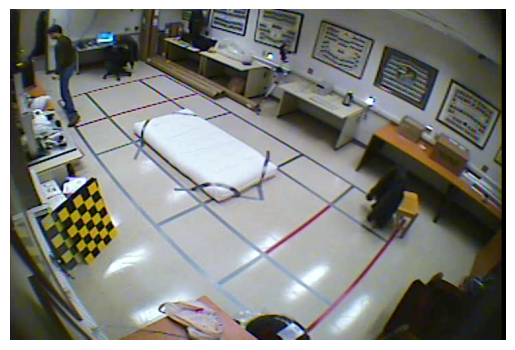

In [18]:
import cv2
from matplotlib import pyplot as plt
import os

# Path to the video file
vid_path = 'multiple-cameras-fall-dataset/dataset/dataset/chute01/cam1.avi'

# Check if the path to the video file exists
if os.path.exists(vid_path):
    # Load the video
    cap = cv2.VideoCapture(vid_path)

    # Read the first frame
    ret, frame = cap.read()

    # Close the video file
    cap.release()

    # If a frame was successfully read
    if ret:
        # Convert the frame from BGR to RGB (for correct display in matplotlib)
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Display the first frame
        plt.imshow(frame_rgb)
        plt.axis('off')  # Turn off axis numbers
        plt.show()
    else:
        print("Error: Can't read the first frame.")
else:
    print("Error: The path to the video does not exist.")


In [19]:
import os
import cv2
import pandas as pd

# Filter annotations for the specific video (chute 1, camera 1 in this example)
video_annotations = annotations[(annotations['chute'] == 1) & (annotations['cam'] == 1)]

In [20]:
# Initialize video capture for camera 1
vid_path = 'multiple-cameras-fall-dataset/dataset/dataset/chute01/cam1.avi'
cap = cv2.VideoCapture(vid_path)

current_frame = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Check the annotation for the current frame
    fall_event = video_annotations[(video_annotations['start'] <= current_frame) &
                                   (video_annotations['end'] >= current_frame)]['label']

    if not fall_event.empty:
        label = fall_event.iloc[0]
        print(f"Frame {current_frame}: {'Fall' if label == 1.0 else 'No Fall'}")
        # Additional processing can be done here for fall frames

    current_frame += 1

cap.release()

Frame 1052: No Fall
Frame 1053: No Fall
Frame 1054: No Fall
Frame 1055: No Fall
Frame 1056: No Fall
Frame 1057: No Fall
Frame 1058: No Fall
Frame 1059: No Fall
Frame 1060: No Fall
Frame 1061: No Fall
Frame 1062: No Fall
Frame 1063: No Fall
Frame 1064: No Fall
Frame 1065: No Fall
Frame 1066: No Fall
Frame 1067: No Fall
Frame 1068: No Fall
Frame 1069: No Fall
Frame 1070: No Fall
Frame 1071: No Fall
Frame 1072: No Fall
Frame 1073: No Fall
Frame 1074: No Fall
Frame 1075: No Fall
Frame 1076: No Fall
Frame 1077: No Fall
Frame 1078: No Fall
Frame 1079: No Fall
Frame 1080: No Fall
Frame 1081: No Fall
Frame 1082: No Fall
Frame 1083: Fall
Frame 1084: Fall
Frame 1085: Fall
Frame 1086: Fall
Frame 1087: Fall
Frame 1088: Fall
Frame 1089: Fall
Frame 1090: Fall
Frame 1091: Fall
Frame 1092: Fall
Frame 1093: Fall
Frame 1094: Fall
Frame 1095: Fall
Frame 1096: Fall
Frame 1097: Fall
Frame 1098: Fall
Frame 1099: Fall
Frame 1100: Fall
Frame 1101: Fall
Frame 1102: Fall
Frame 1103: Fall
Frame 1104: Fall
Frame 

In [21]:
# Base directory where the chutes are located
base_dir = 'multiple-cameras-fall-dataset/dataset/dataset/'

In [22]:
# Directories to save fall and no fall frames
fall_frames_dir = '/content/data_class/fall_frames'
no_fall_frames_dir = '/content/data_class/no_fall_frames'
os.makedirs(fall_frames_dir, exist_ok=True)
os.makedirs(no_fall_frames_dir, exist_ok=True)

In [23]:
# Iterate through each chute directory
for chute_folder in sorted(os.listdir(base_dir)):
    chute_path = os.path.join(base_dir, chute_folder)
    if os.path.isdir(chute_path):
        # Get the chute number (assuming folder name is like 'chute01')
        chute_number = int(chute_folder.replace('chute', ''))

        # Filter annotations for the current chute
        chute_annotations = annotations[annotations['chute'] == chute_number]

        # Iterate through each camera file in the chute directory
        for cam_file in sorted(os.listdir(chute_path)):
            cam_path = os.path.join(chute_path, cam_file)

            # Extract camera number from the file name (assuming file name is like 'cam1.avi')
            cam_number = int(cam_file.replace('cam', '').replace('.avi', ''))

            # Filter annotations for the current camera
            cam_annotations = chute_annotations[chute_annotations['cam'] == cam_number]

            # Start processing the video
            cap = cv2.VideoCapture(cam_path)
            current_frame = 0

            while cap.isOpened():
                ret, frame = cap.read()
                if not ret:
                    break

                # Check the annotation for the current frame
                fall_event = cam_annotations[(cam_annotations['start'] <= current_frame) &
                                             (cam_annotations['end'] >= current_frame)]['label']

                if not fall_event.empty:
                    label = fall_event.iloc[0]
                    frame_path = os.path.join(fall_frames_dir if label == 1.0 else no_fall_frames_dir,
                                              f'{chute_folder}_{cam_file[:-4]}_frame_{current_frame}.jpg')
                    cv2.imwrite(frame_path, frame)

                current_frame += 1

            cap.release()

In [24]:
annotations['frame_id'] = annotations.apply(lambda row: f'chute{int(row.chute)}_cam{int(row.cam)}', axis=1)

In [25]:
# Path to the folder containing fall frames
fall_frames_folder = '/content/data_class/fall_frames'

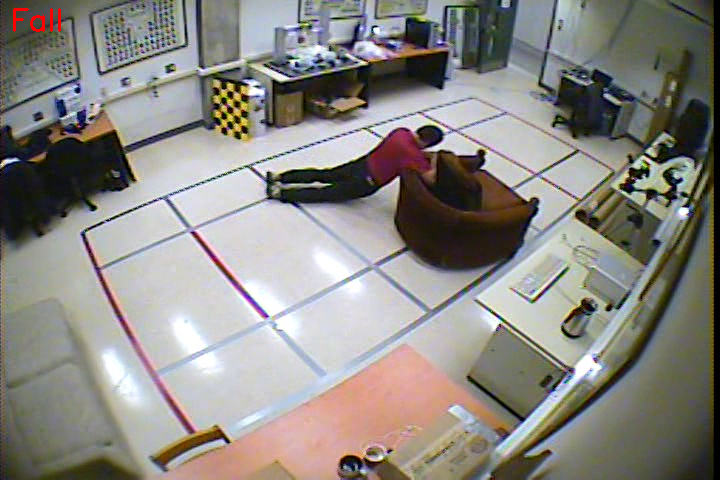

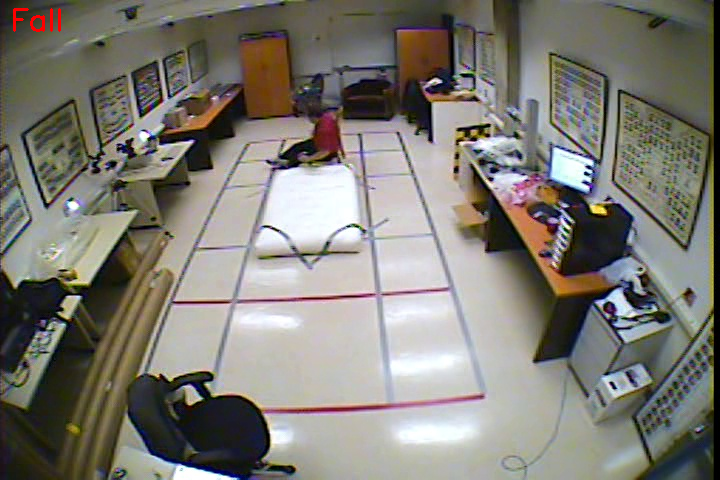

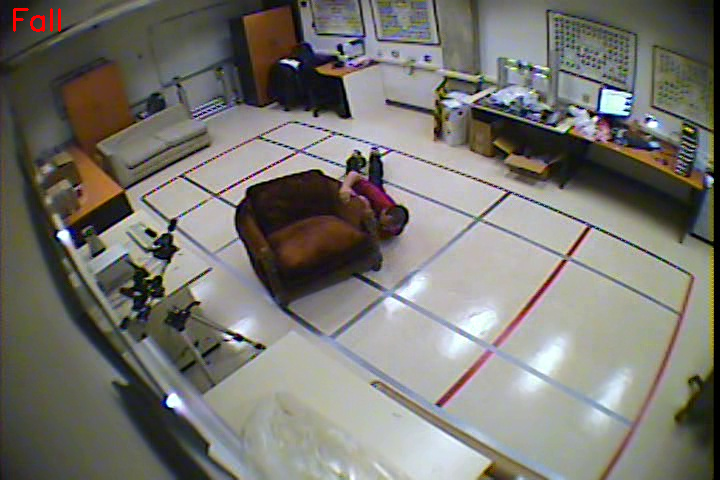

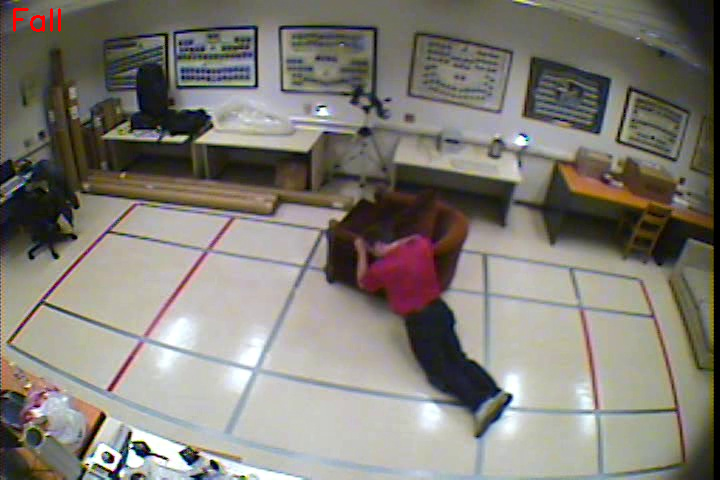

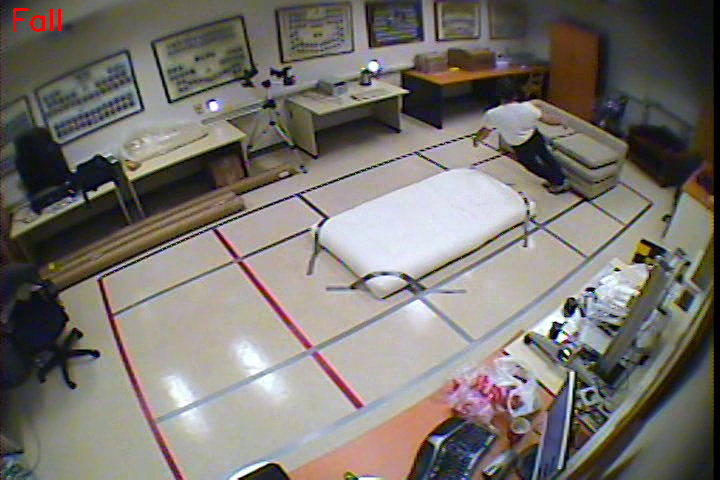

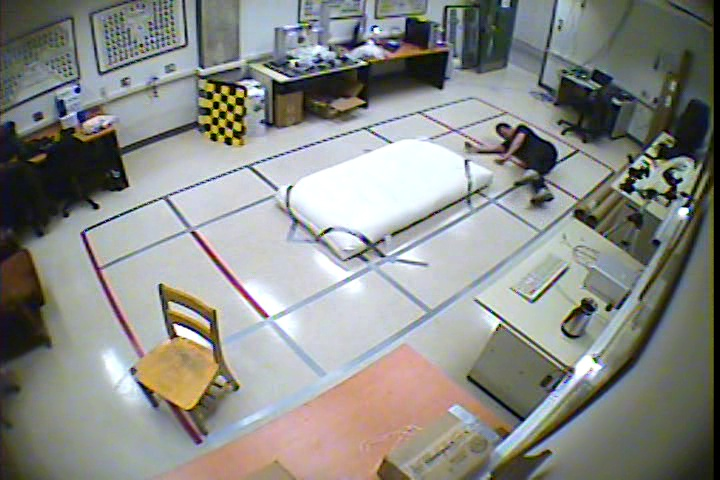

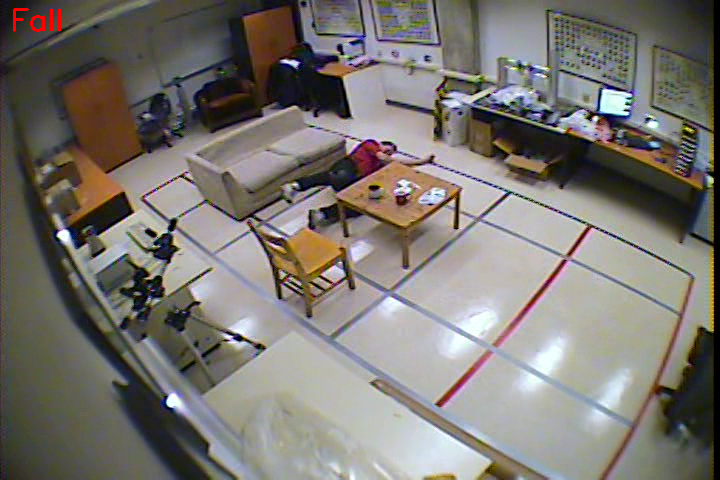

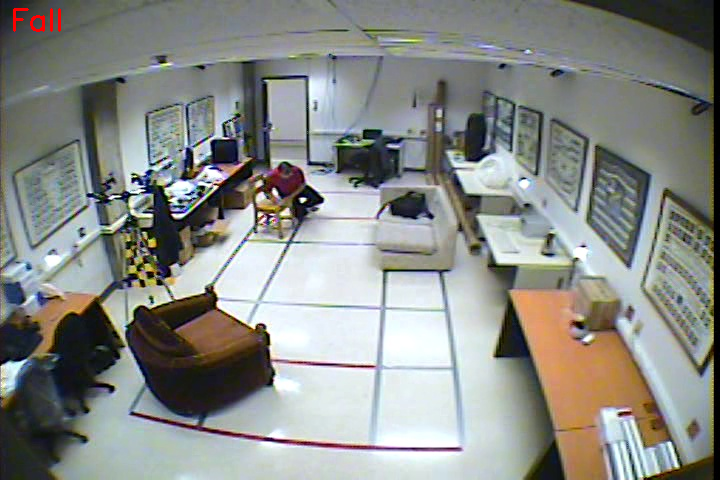

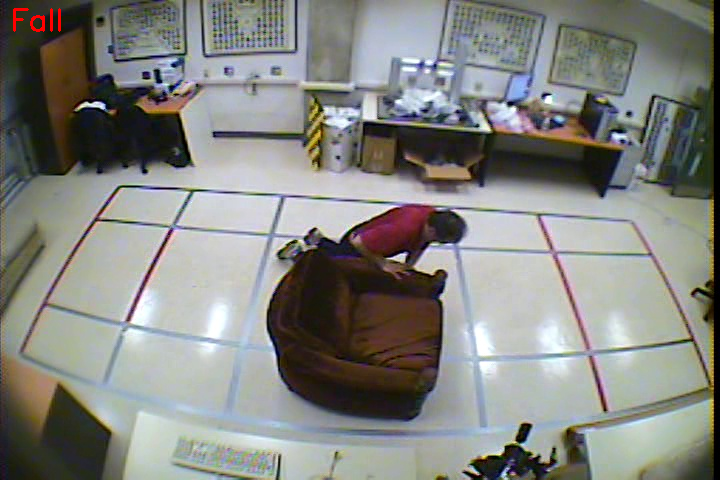

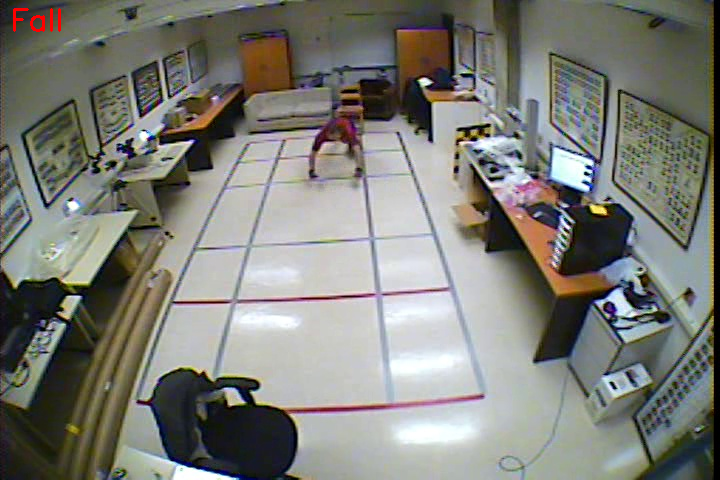

In [26]:
# Iterate through the frames
from google.colab.patches import cv2_imshow

frame_count = 0  # Track the number of frames displayed

for frame_file in os.listdir(fall_frames_folder):
    frame_path = os.path.join(fall_frames_folder, frame_file)
    frame = cv2.imread(frame_path)

    # Extract chute and cam info from frame filename
    chute_cam_info = '_'.join(frame_file.split('_')[:2])

    # Find matching annotations
    matching_annotations = annotations[annotations['frame_id'] == chute_cam_info]

    # Check if the current frame number falls within any 'start' to 'end' range
    frame_number = int(frame_file.split('_')[-1].split('.')[0])
    for _, row in matching_annotations.iterrows():
        if row['start'] <= frame_number <= row['end']:
            label = 'Fall' if row['label'] == 1.0 else 'No Fall'
            # You can add logic here to draw a bounding box or just put text
            cv2.putText(frame, label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            break

    # Display the frame
    cv2_imshow(frame)
    frame_count += 1

    if frame_count == 10:  # Break the loop after displaying 10 frames
        break

cv2.destroyAllWindows()

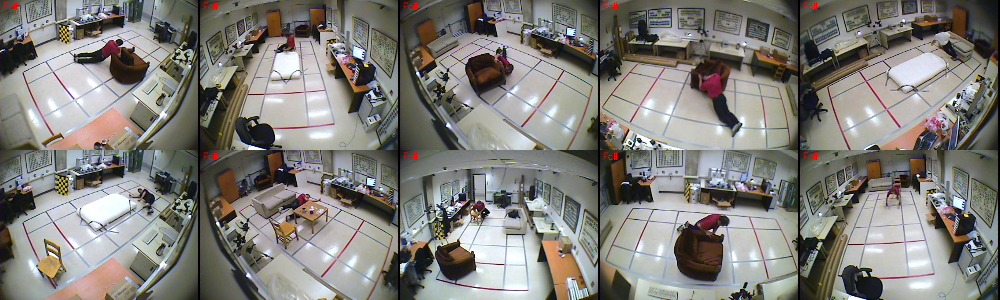

In [27]:
import cv2
import os
import pandas as pd
import numpy as np
from google.colab.patches import cv2_imshow

# Load annotations
# Assuming `annotations` DataFrame is already loaded
# Example: annotations = pd.read_csv('annotations.csv')


# Create a list to hold frames for display
frames_to_display = []

frame_count = 0  # Track the number of frames displayed

for frame_file in os.listdir(fall_frames_folder):
    frame_path = os.path.join(fall_frames_folder, frame_file)
    frame = cv2.imread(frame_path)

    # Extract chute and cam info from frame filename
    chute_cam_info = '_'.join(frame_file.split('_')[:2])

    # Find matching annotations
    matching_annotations = annotations[annotations['frame_id'] == chute_cam_info]

    # Check if the current frame number falls within any 'start' to 'end' range
    frame_number = int(frame_file.split('_')[-1].split('.')[0])
    for _, row in matching_annotations.iterrows():
        if row['start'] <= frame_number <= row['end']:
            label = 'Fall' if row['label'] == 1.0 else 'No Fall'
            # You can add logic here to draw a bounding box or just put text
            cv2.putText(frame, label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
            break

    # Resize the frame to make it smaller
    frame = cv2.resize(frame, (200, 150))

    # Append the frame to the list
    frames_to_display.append(frame)
    frame_count += 1

    if frame_count == 10:  # Break the loop after collecting 10 frames
        break

# Arrange frames in a 2x5 grid
top_row = np.hstack(frames_to_display[:5])
bottom_row = np.hstack(frames_to_display[5:])
grid = np.vstack([top_row, bottom_row])

# Display the grid
cv2_imshow(grid)
cv2.destroyAllWindows()

In [28]:
vid_path = 'multiple-cameras-fall-dataset/dataset/dataset/chute01/cam1.avi'

In [29]:
annotations['frame_id'] = annotations.apply(lambda row: f'chute{int(row.chute)}_cam{int(row.cam)}', axis=1)

In [30]:
# Extract chute and cam info from the video filename
chute_cam_info = '_'.join(os.path.basename(vid_path).split('_')[:2])

In [31]:
# Choose a video (for example, chute1, cam1)
selected_chute = 1
selected_cam = 2

In [32]:
# Filter the annotations for the selected video
video_annotations = annotations[(annotations['chute'] == selected_chute) & (annotations['cam'] == selected_cam)]

In [33]:
# Initialize video capture
cap = cv2.VideoCapture(vid_path)

In [34]:
# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('/content/data_class/output_video.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

current_frame = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    label = 'No Fall'  # Default label
    for _, row in video_annotations.iterrows():
        if row['start'] <= current_frame <= row['end']:
            label = 'Fall' if row['label'] == 1 else 'No Fall'
            break

    # Put the label on the frame
    cv2.putText(frame, label, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

    # Write the frame into the new video
    out.write(frame)
    current_frame += 1

cap.release()
out.release()

#Create the Dataframe

In [35]:
import os
import pandas as pd

# Paths to the folders containing fall and no fall frames
fall_frames_folder = '/content/data_class/fall_frames'
no_fall_frames_folder = '/content/data_class/no_fall_frames'

# Create empty dataframe
columns = ['frame_path', 'class_label']
data = []

# Add fall frames to the dataframe
for frame in os.listdir(fall_frames_folder):
    frame_path = os.path.join(fall_frames_folder, frame)
    data.append([frame_path, 'Fall'])

# Add no fall frames to the dataframe
for frame in os.listdir(no_fall_frames_folder):
    frame_path = os.path.join(no_fall_frames_folder, frame)
    data.append([frame_path, 'No Fall'])

# Create dataframe
main_frame_df = pd.DataFrame(data, columns=columns)


In [36]:
main_frame_df.head()

,frame_path,class_label
0,/content/data_class/fall_frames/chute19_cam8_f...,Fall
1,/content/data_class/fall_frames/chute10_cam4_f...,Fall
2,/content/data_class/fall_frames/chute19_cam6_f...,Fall
3,/content/data_class/fall_frames/chute19_cam2_f...,Fall
4,/content/data_class/fall_frames/chute13_cam3_f...,Fall


In [37]:
grouped_main_df = main_frame_df.groupby('class_label').count()
grouped_main_df

,frame_path
class_label,
Fall,7914
No Fall,8920


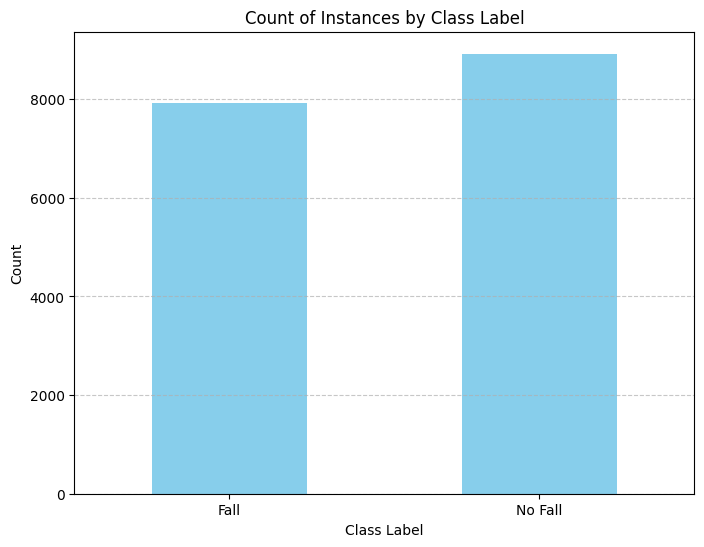

In [38]:
# Plot the bar graph
plt.figure(figsize=(8, 6))
grouped_main_df['frame_path'].plot(kind='bar', color='skyblue')
plt.title('Count of Instances by Class Label')
plt.xlabel('Class Label')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [39]:
main_frame_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16834 entries, 0 to 16833
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   frame_path   16834 non-null  object
 1   class_label  16834 non-null  object
dtypes: object(2)
memory usage: 263.2+ KB


In [40]:
main_frame_df['class_label'] = main_frame_df['class_label'].replace('Fall', 0)
main_frame_df['class_label'] = main_frame_df['class_label'].replace('No Fall', 1)

In [41]:
main_frame_df

,frame_path,class_label
0,/content/data_class/fall_frames/chute19_cam8_f...,0
1,/content/data_class/fall_frames/chute10_cam4_f...,0
2,/content/data_class/fall_frames/chute19_cam6_f...,0
3,/content/data_class/fall_frames/chute19_cam2_f...,0
4,/content/data_class/fall_frames/chute13_cam3_f...,0
...,...,...
16829,/content/data_class/no_fall_frames/chute03_cam...,1
16830,/content/data_class/no_fall_frames/chute02_cam...,1
16831,/content/data_class/no_fall_frames/chute23_cam...,1
16832,/content/data_class/no_fall_frames/chute06_cam...,1


In [42]:
os.makedirs('/content/processed_data_class/fall_frames', exist_ok=True)
os.makedirs('/content/processed_data_class/no_fall_frames', exist_ok=True)

In [43]:
# !pip install tensorflow tensorflow-hub opencv-python-headless pandas

In [44]:
import tensorflow_hub as hub

# Load the pre-trained TensorFlow model from TensorFlow Hub
detector = hub.load("https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1")

In [45]:
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz -P /content/

--2024-06-30 22:43:03--  http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.141.207, 142.251.2.207, 74.125.137.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.141.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149119618 (142M) [application/x-tar]
Saving to: ‘/content/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’

faster_rcnn_incepti 100%[===================>] 142.21M   116MB/s    in 1.2s    

2024-06-30 22:43:04 (116 MB/s) - ‘/content/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’ saved [149119618/149119618]



In [46]:
!tar -xvzf /content/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz -C /content/

faster_rcnn_inception_v2_coco_2018_01_28/
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.index
faster_rcnn_inception_v2_coco_2018_01_28/checkpoint
faster_rcnn_inception_v2_coco_2018_01_28/pipeline.config
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.meta
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/saved_model.pb
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/variables/
faster_rcnn_inception_v2_coco_2018_01_28/frozen_inference_graph.pb


In [47]:
import tensorflow as tf

# Set the correct directory for the saved model
model_dir = '/content/faster_rcnn_inception_v2_coco_2018_01_28/saved_model'

# Load the saved model
loaded_model = tf.saved_model.load(model_dir)

# Get the inference function from the loaded model
infer = loaded_model.signatures['serving_default']

In [48]:
from object_detection.utils import label_map_util

path_to_labels = '/content/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(path_to_labels, use_display_name=True)

In [49]:
import os
import pandas as pd
import tensorflow as tf
import numpy as np
import cv2
from object_detection.utils import label_map_util, visualization_utils as viz_utils
import cv2
from object_detection.utils import visualization_utils as viz_utils

# Paths to the folders containing fall and no fall frames
fall_frames_folder = '/content/data_class/fall_frames'
no_fall_frames_folder = '/content/data_class/no_fall_frames'

# Create empty dataframe
columns = ['frame_path', 'class_label']
data = []

# Add fall frames to the dataframe
for frame in os.listdir(fall_frames_folder):
    frame_path = os.path.join(fall_frames_folder, frame)
    data.append([frame_path, 'Fall'])

# Add no fall frames to the dataframe
for frame in os.listdir(no_fall_frames_folder):
    frame_path = os.path.join(no_fall_frames_folder, frame)
    data.append([frame_path, 'No Fall'])

# Create dataframe
main_frame_df = pd.DataFrame(data, columns=columns)

# Convert class to integer
main_frame_df['class_label'] = main_frame_df['class_label'].replace('Fall', 0)
main_frame_df['class_label'] = main_frame_df['class_label'].replace('No Fall', 1)

# Create directories for processed data
processed_fall_frames_folder = '/content/processed_data_class/fall_frames'
processed_no_fall_frames_folder = '/content/processed_data_class/no_fall_frames'
os.makedirs(processed_fall_frames_folder, exist_ok=True)
os.makedirs(processed_no_fall_frames_folder, exist_ok=True)

# Load the pre-trained TensorFlow model from TensorFlow Hub
detector = tf.saved_model.load('/content/faster_rcnn_inception_v2_coco_2018_01_28/saved_model')
infer = detector.signatures['serving_default']

# Load label map
path_to_labels = '/content/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(path_to_labels, use_display_name=True)

# Function to run inference and save detected images
def run_inference_and_save(model, image_path, output_dir, frame_num, class_label):
    image_np = cv2.imread(image_path)
    input_tensor = tf.convert_to_tensor(image_np)
    input_tensor = input_tensor[tf.newaxis, ...]

    detections = model(input_tensor)

    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                  for key, value in detections.items()}
    detections['num_detections'] = num_detections
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        detections['detection_boxes'],
        detections['detection_classes'],
        detections['detection_scores'],
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=0.5,
        agnostic_mode=False)

    boxes = []  # Store bounding boxes for persons
    for i in range(num_detections):
        if detections['detection_scores'][i] > 0.5 and detections['detection_classes'][i] == 1:  # Check if class is "person"
            box = detections['detection_boxes'][i]  # Normalized coordinates [y_min, x_min, y_max, x_max]
            display_str = "Fall" if class_label == 0 else "No Fall"
            color = (0, 255, 0) if class_label == 0 else (0, 0, 255)
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 0.7
            thickness = 2
            text_width, text_height = cv2.getTextSize(display_str, font, fontScale=font_scale, thickness=thickness)[0]
            text_offset_x = int(box[1] * image_np.shape[1])  # x_min
            text_offset_y = int(box[0] * image_np.shape[0]) - 10  # y_min
            box_coords = ((text_offset_x, text_offset_y + 5), (text_offset_x + text_width + 2, text_offset_y - text_height - 5))
            image_np = cv2.rectangle(image_np, box_coords[0], box_coords[1], color, cv2.FILLED)
            cv2.putText(image_np, display_str, (text_offset_x, text_offset_y), font, font_scale, (255, 255, 255), thickness)
            boxes.append([box[1], box[0], box[3], box[2]])  # Convert to [x_min, y_min, x_max, y_max] for consistency with typical BBox formats

    output_path = os.path.join(output_dir, f'detected_frame_{frame_num}.jpg')
    cv2.imwrite(output_path, image_np)
    return output_path, boxes



# Process each frame in the dataframe and create a new dataframe with detected image paths
new_data = []
for idx, row in main_frame_df.iterrows():
    frame_path = row['frame_path']
    class_label = row['class_label']
    output_dir = processed_fall_frames_folder if class_label == 0 else processed_no_fall_frames_folder
    detected_frame_path, boxes = run_inference_and_save(infer, frame_path, output_dir, idx, class_label)
    for box in boxes:  # Might be multiple detections per image
        new_data.append([detected_frame_path, class_label, box])

detected_frame_df = pd.DataFrame(new_data, columns=['detected_frame_path', 'class_label', 'box'])
print(detected_frame_df.head())

                                 detected_frame_path  class_label  \
0  /content/processed_data_class/fall_frames/dete...            0   
1  /content/processed_data_class/fall_frames/dete...            0   
2  /content/processed_data_class/fall_frames/dete...            0   
3  /content/processed_data_class/fall_frames/dete...            0   
4  /content/processed_data_class/fall_frames/dete...            0   

                                                box  
0     [0.4772967, 0.92678094, 0.5756364, 0.9994455]  
1  [0.42459255, 0.21114723, 0.48187414, 0.34311938]  
2    [0.47585925, 0.31893468, 0.5474364, 0.4682856]  
3  [0.51583093, 0.30955574, 0.54190236, 0.39171934]  
4     [0.451765, 0.38437805, 0.70568174, 0.9221159]  


In [50]:
detected_frame_df

,detected_frame_path,class_label,box
0,/content/processed_data_class/fall_frames/dete...,0,"[0.4772967, 0.92678094, 0.5756364, 0.9994455]"
1,/content/processed_data_class/fall_frames/dete...,0,"[0.42459255, 0.21114723, 0.48187414, 0.34311938]"
2,/content/processed_data_class/fall_frames/dete...,0,"[0.47585925, 0.31893468, 0.5474364, 0.4682856]"
3,/content/processed_data_class/fall_frames/dete...,0,"[0.51583093, 0.30955574, 0.54190236, 0.39171934]"
4,/content/processed_data_class/fall_frames/dete...,0,"[0.451765, 0.38437805, 0.70568174, 0.9221159]"
...,...,...,...
18549,/content/processed_data_class/no_fall_frames/d...,1,"[0.599431, 0.3699794, 0.82517344, 0.80653274]"
18550,/content/processed_data_class/no_fall_frames/d...,1,"[0.48732916, 0.2527091, 0.67121404, 0.6754636]"
18551,/content/processed_data_class/no_fall_frames/d...,1,"[0.38199505, 0.08202795, 0.47599897, 0.49502936]"
18552,/content/processed_data_class/no_fall_frames/d...,1,"[0.47316462, 0.9477265, 0.517038, 0.9979584]"


In [51]:
grouped_det_df = detected_frame_df.groupby('class_label').count()
grouped_det_df

,detected_frame_path,box
class_label,,
0,8613,8613
1,9941,9941


In [52]:
%matplotlib inline

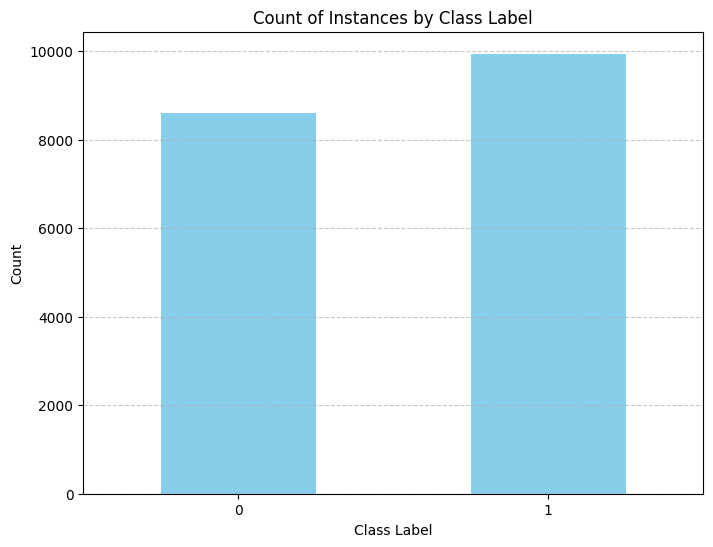

In [53]:
# Plot the bar graph
plt.figure(figsize=(8, 6))
grouped_det_df['detected_frame_path'].plot(kind='bar', color='skyblue')
plt.title('Count of Instances by Class Label')
plt.xlabel('Class Label')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

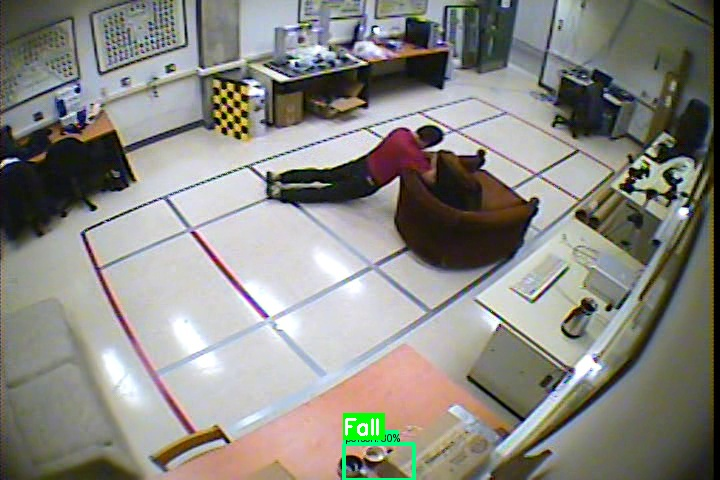

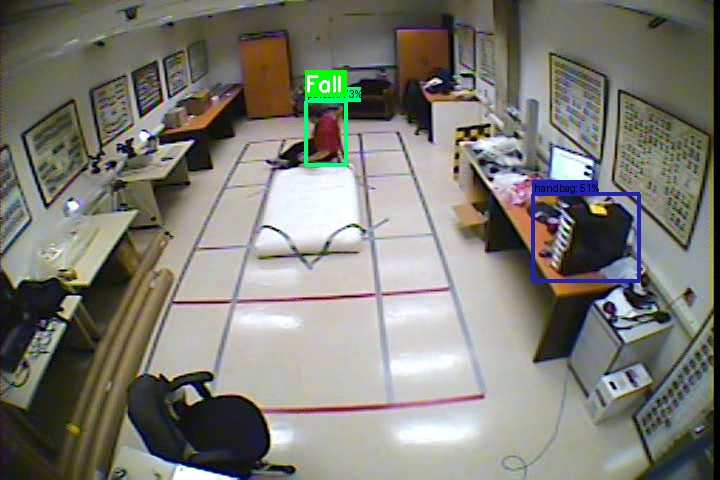

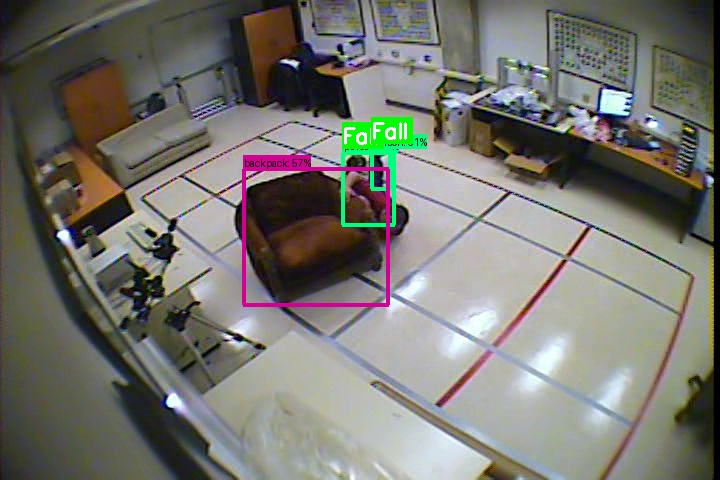

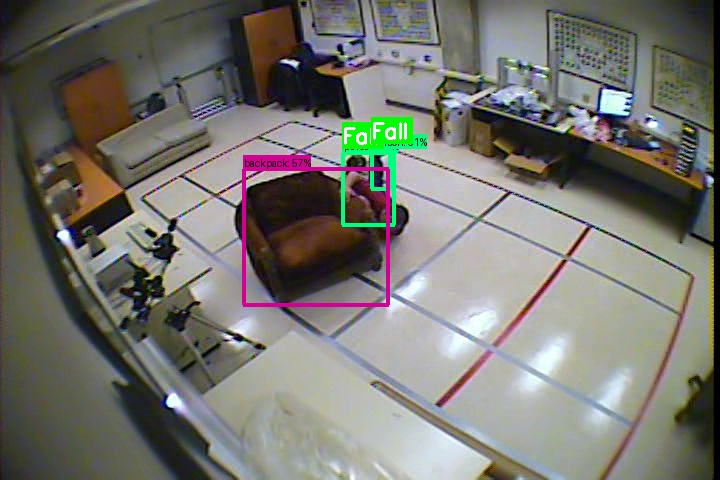

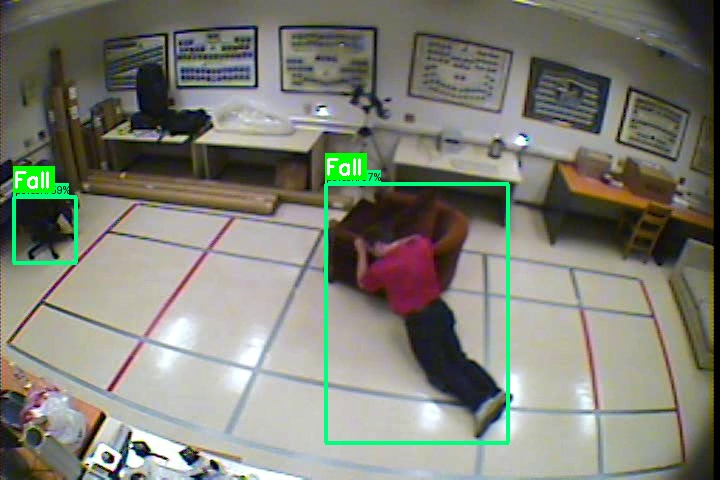

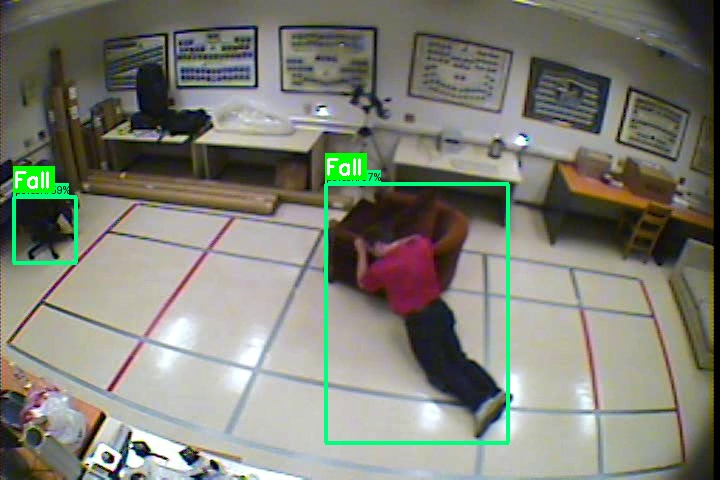

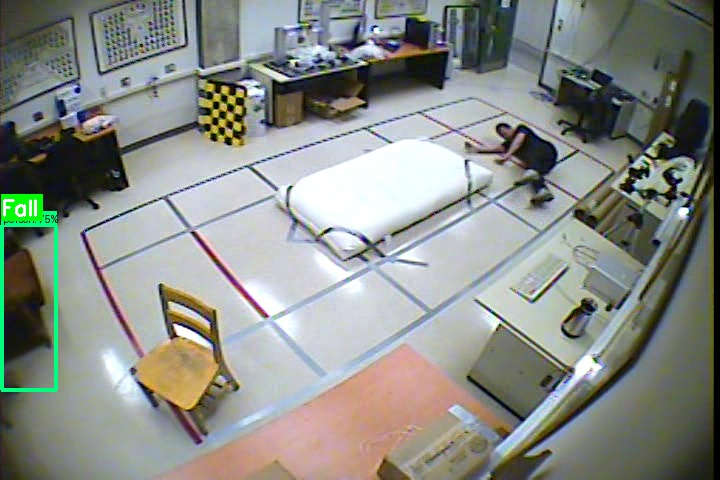

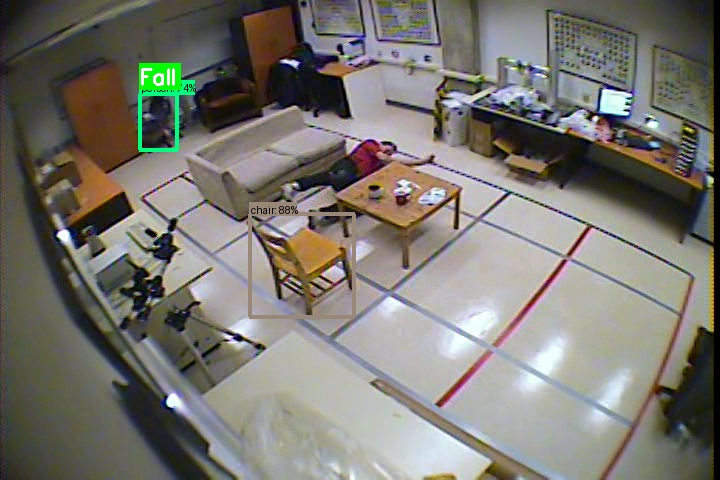

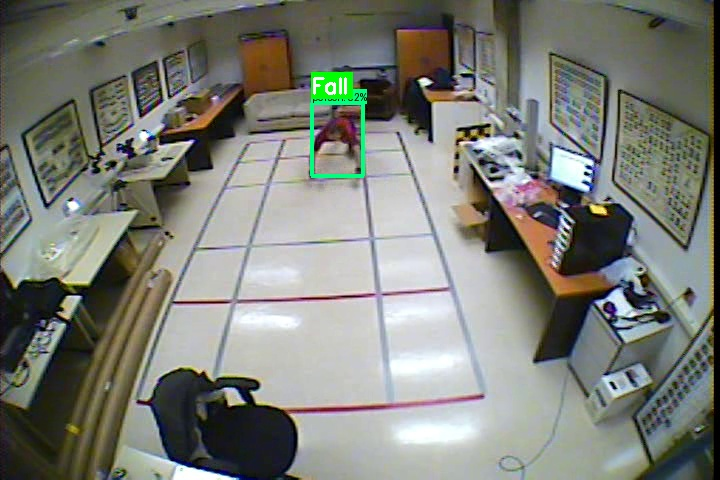

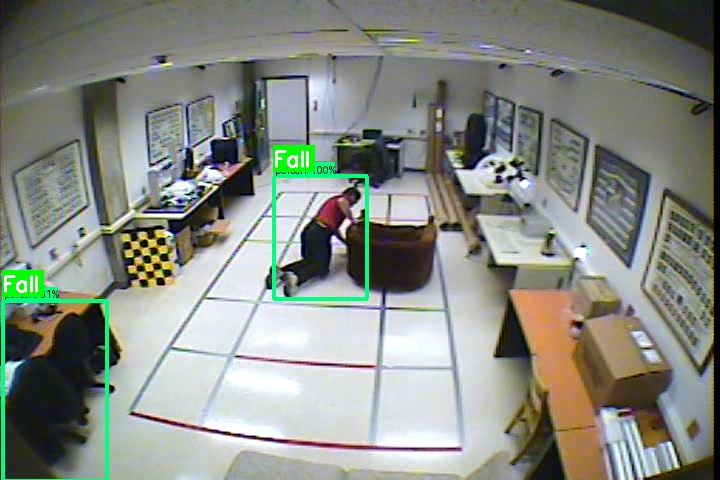

In [54]:
from IPython.display import Image, display

# Display the first 10 images from the detected_frame_df
for image_file in detected_frame_df['detected_frame_path'].head(10):
    display(Image(filename=image_file))

In [55]:
# Save the new dataframe to a CSV file if needed
detected_frame_df.to_csv('/content/detected_frames.csv', index=False)

In [56]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [57]:
# def get_box_from_detection(image_path, df):
#     # Here, you might need to find the corresponding bounding box data from your dataframe
#     # Assuming there's a dataframe 'df' where the index or a column can help find the associated bounding box
#     box_data = df.loc[df['detected_frame_path'] == image_path, 'bounding_box_column'].values[0]
#     return box_data

In [58]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Directory setup
base_dir = '/content/dataset'
os.makedirs(f'{base_dir}/images/train', exist_ok=True)
os.makedirs(f'{base_dir}/images/val', exist_ok=True)
os.makedirs(f'{base_dir}/labels/train', exist_ok=True)
os.makedirs(f'{base_dir}/labels/val', exist_ok=True)

# Splitting data into train and validation
train_df, val_df = train_test_split(detected_frame_df, test_size=0.2, random_state=42)

# Function to move files and create labels in YOLO format
def move_files_and_create_labels(df, subset):
    for _, row in df.iterrows():
        frame_path = row['detected_frame_path']
        label = row['class_label']
        box = row['box']  # Extract bounding box
        file_name = os.path.basename(frame_path)
        image_path = f'{base_dir}/images/{subset}/{file_name}'
        label_path = f'{base_dir}/labels/{subset}/{file_name.replace(".jpg", ".txt")}'

        print(f"Attempting to move {frame_path} to {image_path}")  # Diagnostic print

        if not os.path.exists(frame_path):
            print(f"File not found: {frame_path}")  # Diagnostic print
            continue

        shutil.move(frame_path, image_path)
        print(f"File moved successfully to {image_path}")  # Diagnostic print



        # Calculate normalized bounding box coordinates for YOLO
        img = cv2.imread(image_path)
        height, width, _ = img.shape

        x_center = ((box[1] + box[3]) / 2) * width
        y_center = ((box[0] + box[2]) / 2) * height
        bbox_width = (box[3] - box[1]) * width
        bbox_height = (box[2] - box[0]) * height

        # Normalize coordinates by image dimensions
        x_center /= width
        y_center /= height
        bbox_width /= width
        bbox_height /= height

        with open(label_path, 'w') as label_file:
            label_file.write(f'{label} {x_center} {y_center} {bbox_width} {bbox_height}\n')

# Move training files and create labels
move_files_and_create_labels(train_df, 'train')

# Move validation files and create labels
move_files_and_create_labels(val_df, 'val')

Streaming output truncated to the last 5000 lines.
Attempting to move /content/processed_data_class/fall_frames/detected_frame_6430.jpg to /content/dataset/images/val/detected_frame_6430.jpg
File not found: /content/processed_data_class/fall_frames/detected_frame_6430.jpg
Attempting to move /content/processed_data_class/fall_frames/detected_frame_4468.jpg to /content/dataset/images/val/detected_frame_4468.jpg
File not found: /content/processed_data_class/fall_frames/detected_frame_4468.jpg
Attempting to move /content/processed_data_class/fall_frames/detected_frame_5913.jpg to /content/dataset/images/val/detected_frame_5913.jpg
File moved successfully to /content/dataset/images/val/detected_frame_5913.jpg
Attempting to move /content/processed_data_class/no_fall_frames/detected_frame_14750.jpg to /content/dataset/images/val/detected_frame_14750.jpg
File not found: /content/processed_data_class/no_fall_frames/detected_frame_14750.jpg
Attempting to move /content/processed_data_class/no_fal

In [59]:
# Define the content of your data.yaml file
yaml_content = """
train: /content/dataset/images/train
val: /content/dataset/images/val

nc: 2  # number of classes
names: ['No Fall', 'Fall']
"""

os.makedirs('/content/yolo/', exist_ok=True)

# Write the YAML content to a file
%cd /content/yolo
with open('data.yaml', 'w') as file:
    file.write(yaml_content)


/content/yolo


In [60]:
!pip install ultralytics
!pip install opencv-python-headless

In [61]:
!nvidia-smi

Sun Jun 30 23:12:21 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P0              28W /  70W |   8829MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [62]:
!git clone https://github.com/THU-MIG/yolov10.git

Cloning into 'yolov10'...
remote: Enumerating objects: 20304, done.
remote: Counting objects: 100% (1347/1347), done.
remote: Compressing objects: 100% (127/127), done.
remote: Total 20304 (delta 1301), reused 1223 (delta 1220), pack-reused 18957
Receiving objects: 100% (20304/20304), 11.18 MiB | 14.79 MiB/s, done.
Resolving deltas: 100% (14304/14304), done.


In [63]:
pwd

'/content/yolo'

In [64]:
cd yolov10

/content/yolo/yolov10


In [65]:
import pandas as pd
import os
from ultralytics import YOLO
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
import cv2
import numpy as np

In [66]:
import os
import urllib.request

weights_dir = os.path.join(os.getcwd(), "weights")
os.makedirs(weights_dir, exist_ok=True)

urls = [
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10n.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10s.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10m.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10b.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10x.pt",
    "https://github.com/jameslahm/yolov10/releases/download/v1.0/yolov10l.pt"
]

for url in urls:
    file_name = os.path.join(weights_dir, os.path.basename(url))
    urllib.request.urlretrieve(url, file_name)
    print(f"Downloaded {file_name}")

Downloaded /content/yolo/yolov10/weights/yolov10n.pt
Downloaded /content/yolo/yolov10/weights/yolov10s.pt
Downloaded /content/yolo/yolov10/weights/yolov10m.pt
Downloaded /content/yolo/yolov10/weights/yolov10b.pt
Downloaded /content/yolo/yolov10/weights/yolov10x.pt
Downloaded /content/yolo/yolov10/weights/yolov10l.pt


In [ ]:
!yolo task=detect mode=train epochs=20 batch=16 plots=True model=weights/yolov10n.pt data=/content/yolo/data.yaml


Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=weights/yolov10n.pt, data=/content/yolo/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

In [ ]:
# Run detection
!python detect.py --weights /content/yolo/yolov10/runs/detect/train/weights/best.pt --img 640 --conf 0.25 --source /content/dataset/images/val

python3: can't open file '/content/yolo/yolov10/detect.py': [Errno 2] No such file or directory


In [ ]:
!yolo task=detect mode=val model=runs/detect/train/weights/best.pt data=/content/yolo/data.yaml

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2695196 parameters, 0 gradients, 8.2 GFLOPs
val: Scanning /content/dataset/labels/val.cache... 2028 images, 0 backgrounds, 0 corrupt: 100% 2028/2028 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 127/127 [00:23<00:00,  5.48it/s]
                   all       2028       2028      0.935      0.921      0.982       0.89
               No Fall        980        980      0.932      0.907       0.98      0.893
                  Fall       1048       1048      0.938      0.935      0.984      0.886
Speed: 0.3ms preprocess, 3.6ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


#**Save the model**

In [ ]:
import pandas as pd

# Path to the results.csv file
results_file = '/content/yolo/yolov10/runs/detect/train/results.csv'

# Read the results.csv file
df = pd.read_csv(results_file)

# Display the first few rows of the dataframe to see the column names and data
print(df.head())
print(df.columns)

                     epoch           train/box_loss           train/cls_loss  \
0                        1                   4.4783                  10.3680   
1                        2                   3.8746                   6.2965   
2                        3                   3.6398                   5.4330   
3                        4                   3.4173                   4.8583   
4                        5                   3.2380                   4.2297   

            train/dfl_loss     metrics/precision(B)        metrics/recall(B)  \
0                   3.7776                  0.03423                  0.03709   
1                   3.4009                  0.10309                  0.25792   
2                   3.2526                  0.22593                  0.36594   
3                   3.0937                  0.52432                  0.59178   
4                   2.9749                  0.61571                  0.64798   

          metrics/mAP50(B)      metric

Cleaned Column Names:
Index(['epoch', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')

First few rows of the dataframe:
   epoch  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1          4.4783         10.3680          3.7776   
1      2          3.8746          6.2965          3.4009   
2      3          3.6398          5.4330          3.2526   
3      4          3.4173          4.8583          3.0937   
4      5          3.2380          4.2297          2.9749   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.03423            0.03709           0.01642   
1               0.10309            0.25792           0.07890   
2               0.22593            0.36594           0.20793   
3               0.52432            0.59178     

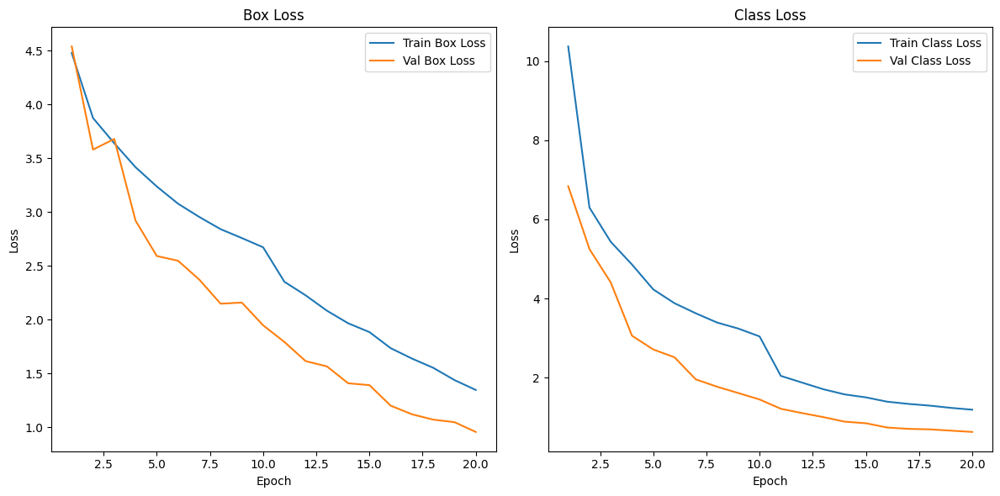

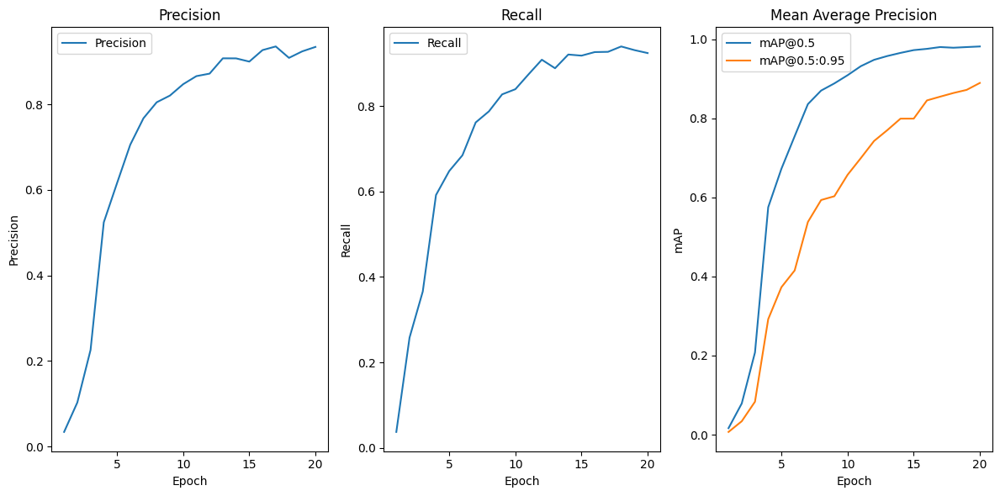

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to the results.csv file
results_file = '/content/yolo/yolov10/runs/detect/train/results.csv'

# Read the results.csv file
df = pd.read_csv(results_file)

# Strip leading and trailing spaces from column names
df.columns = df.columns.str.strip()

# Display the cleaned column names and the first few rows to verify
print("Cleaned Column Names:")
print(df.columns)

print("\nFirst few rows of the dataframe:")
print(df.head())

# Column names after stripping spaces
epoch_col = 'epoch'
train_box_loss_col = 'train/box_loss'
val_box_loss_col = 'val/box_loss'
train_cls_loss_col = 'train/cls_loss'
val_cls_loss_col = 'val/cls_loss'
precision_col = 'metrics/precision(B)'
recall_col = 'metrics/recall(B)'
map50_col = 'metrics/mAP50(B)'
map5095_col = 'metrics/mAP50-95(B)'

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(df[epoch_col], df[train_box_loss_col], label='Train Box Loss')
plt.plot(df[epoch_col], df[val_box_loss_col], label='Val Box Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Box Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(df[epoch_col], df[train_cls_loss_col], label='Train Class Loss')
plt.plot(df[epoch_col], df[val_cls_loss_col], label='Val Class Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Class Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Plot precision, recall, and mAP
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.plot(df[epoch_col], df[precision_col], label='Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.title('Precision')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df[epoch_col], df[recall_col], label='Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.title('Recall')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df[epoch_col], df[map50_col], label='mAP@0.5')
plt.plot(df[epoch_col], df[map5095_col], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Mean Average Precision')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import shutil
import os

# Source path (location of the saved model)
source_path = "runs/detect/train/weights/best.pt"

# Destination path (desired location to save the model)
destination_path = "/content/yolo/saved_models/best.pt"

# Create the destination directory if it doesn't exist
os.makedirs(os.path.dirname(destination_path), exist_ok=True)

# Copy the file
shutil.copy(source_path, destination_path)

# Verify the model copy
if os.path.exists(destination_path):
    print("Model saved successfully.")
else:
    print("Model saving failed.")

Model saved successfully.


In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model=runs/detect/train/weights/best.pt source=/content/multiple-cameras-fall-dataset/dataset/dataset/chute21/cam1.avi

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2695196 parameters, 0 gradients, 8.2 GFLOPs

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 591, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/model.py", line 442, in predict
    return self.predictor.predict_cli(source=source) if is_cli else self.predictor(source=source, stream=stream)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/predictor.py", line 183, in predict_cli
    for _ in gen:  # sourcery skip: remove-empty-nested-block, noqa
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py", line 35, in generator_context
    response = gen.send(None)
  File "/usr/local/lib/pyth

In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model=runs/detect/train/weights/best.pt source=img.jpg

Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2695196 parameters, 0 gradients, 8.2 GFLOPs

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 591, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/model.py", line 442, in predict
    return self.predictor.predict_cli(source=source) if is_cli else self.predictor(source=source, stream=stream)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/predictor.py", line 183, in predict_cli
    for _ in gen:  # sourcery skip: remove-empty-nested-block, noqa
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py", line 35, in generator_context
    response = gen.send(None)
  File "/usr/local/lib/pyth

In [ ]:
# Zip the best model weights
!zip -r yolov10_best_model.zip /content/yolo/yolov10/runs/detect/train/weights/best.pt

# Download the zipped model weights
from google.colab import files
files.download('yolov10_best_model.zip')

# Evaluate the model
!python val.py --data /content/yolo/data.yaml --weights runs/train/exp/weights/best.pt --img 640 --batch 16

  adding: content/yolo/yolov10/runs/detect/train/weights/best.pt (deflated 10%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

python3: can't open file '/content/yolo/yolov10/val.py': [Errno 2] No such file or directory


In [67]:
%cd /content/models/research/yolov5

/content/models/research/yolov5


In [68]:
# Run this command to start training
!python train.py --img 640 --batch 16 --epochs 15 --data /content/yolo/data.yaml --weights yolov5s.pt --cache

2024-06-30 23:12:42.929536: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-30 23:12:42.967404: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-30 23:12:42.967474: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolo/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=15, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cl

In [69]:
# Run detection
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source /content/dataset/images/val

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/dataset/images/val, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/2028 /content/dataset/images/val/detected_frame_0.jpg: 448x640 2 No Falls, 54.6ms
image 2/2028 /content/dataset/images/val/detected_frame_1000.jpg: 448x640 1 No Fall, 8.7ms
image 3/2028 /content/dataset/images/val/detected_frame_1001.jpg: 448x640 2 No Falls, 8.6ms
image 

In [70]:
from IPython.display import Image, display
import glob

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [71]:
# Zip the best model weights
!zip -r yolov5_best_model.zip runs/train/exp/weights/best.pt

# Download the zipped model weights
from google.colab import files
files.download('yolov5_best_model.zip')

# Evaluate the model
!python val.py --data /content/yolo/data.yaml --weights runs/train/exp/weights/best.pt --img 640 --batch 16

  adding: runs/train/exp/weights/best.pt (deflated 9%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

val: data=/content/yolo/data.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=16, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-334-g100a423b Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/dataset/labels/val.cache... 2028 images, 0 backgrounds, 0 corrupt: 100% 2028/2028 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 127/127 [00:45<00:00,  2.79it/s]
                   all       2028       2028      0.924      0.907      0.955      0.729
               No Fall       2028        980      0.908      0.915      0.951      0.726
                  Fall      

In [74]:
df

,epoch,train/box_loss,train/obj_loss,train/cls_loss,metrics/precision,metrics/recall,metrics/mAP_0.5,metrics/mAP_0.5:0.95,val/box_loss,val/obj_loss,val/cls_loss,x/lr0,x/lr1,x/lr2
0,0,0.079843,0.020422,0.025448,0.16112,0.098946,0.05089,0.013801,0.059270,0.012920,0.011591,0.070042,0.003329,0.003329
1,1,0.062723,0.018856,0.011744,0.30321,0.379420,0.26368,0.088943,0.050725,0.010770,0.003874,0.039602,0.006222,0.006222
2,2,0.056214,0.016904,0.010025,0.45126,0.436610,0.42068,0.155710,0.045873,0.009898,0.004758,0.008722,0.008676,0.008676
3,3,0.050995,0.015612,0.009312,0.68241,0.620110,0.68664,0.294120,0.040464,0.008240,0.003260,0.008020,0.008020,0.008020
4,4,0.047199,0.014597,0.008801,0.80647,0.716170,0.77910,0.374220,0.035614,0.007937,0.003233,0.008020,0.008020,0.008020
5,5,0.043731,0.013938,0.008115,0.88130,0.784360,0.85728,0.450700,0.033854,0.007124,0.003487,0.007360,0.007360,0.007360
6,6,0.041467,0.013302,0.007919,0.90760,0.831190,0.89074,0.522160,0.030751,0.006606,0.002471,0.006700,0.006700,0.006700
7,7,0.039647,0.012834,0.007539,0.91246,0.832620,0.90942,0.550060,0.029513,0.006419,0.002514,0.006040,0.006040,0.006040
8,8,0.037846,0.012575,0.007457,0.93285,0.853760,0.92240,0.595790,0.027909,0.006078,0.002245,0.005380,0.005380,0.005380
9,9,0.036320,0.012152,0.007235,0.92918,0.866910,0.92565,0.622610,0.025905,0.005611,0.002129,0.004720,0.004720,0.004720


Cleaned Column Names:
Index(['epoch', 'train/box_loss', 'train/obj_loss', 'train/cls_loss',
       'metrics/precision', 'metrics/recall', 'metrics/mAP_0.5',
       'metrics/mAP_0.5:0.95', 'val/box_loss', 'val/obj_loss', 'val/cls_loss',
       'x/lr0', 'x/lr1', 'x/lr2'],
      dtype='object')

First few rows of the dataframe:
   epoch  train/box_loss  train/obj_loss  train/cls_loss  metrics/precision  \
0      0        0.079843        0.020422        0.025448            0.16112   
1      1        0.062723        0.018856        0.011744            0.30321   
2      2        0.056214        0.016904        0.010025            0.45126   
3      3        0.050995        0.015612        0.009312            0.68241   
4      4        0.047199        0.014597        0.008801            0.80647   

   metrics/recall  metrics/mAP_0.5  metrics/mAP_0.5:0.95  val/box_loss  \
0        0.098946          0.05089              0.013801      0.059270   
1        0.379420          0.26368              0.

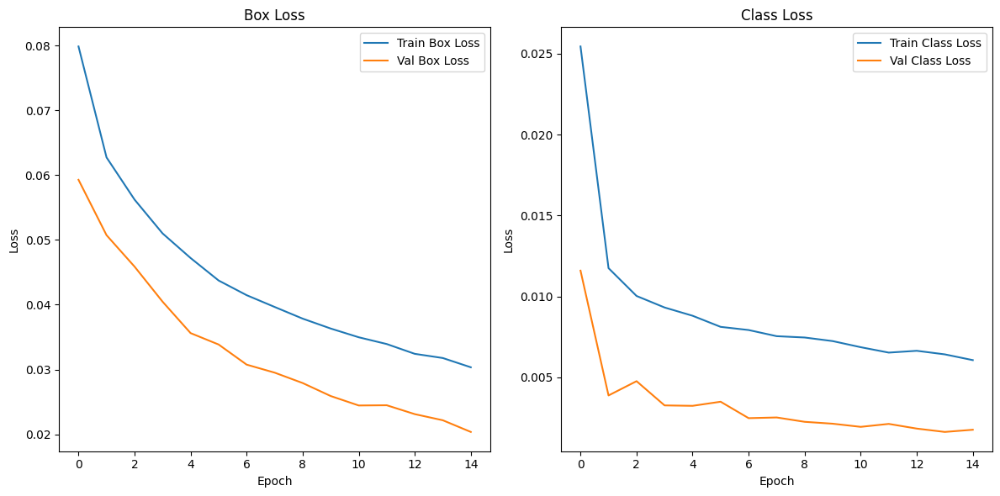

KeyError: 'metrics/mAP50-95'

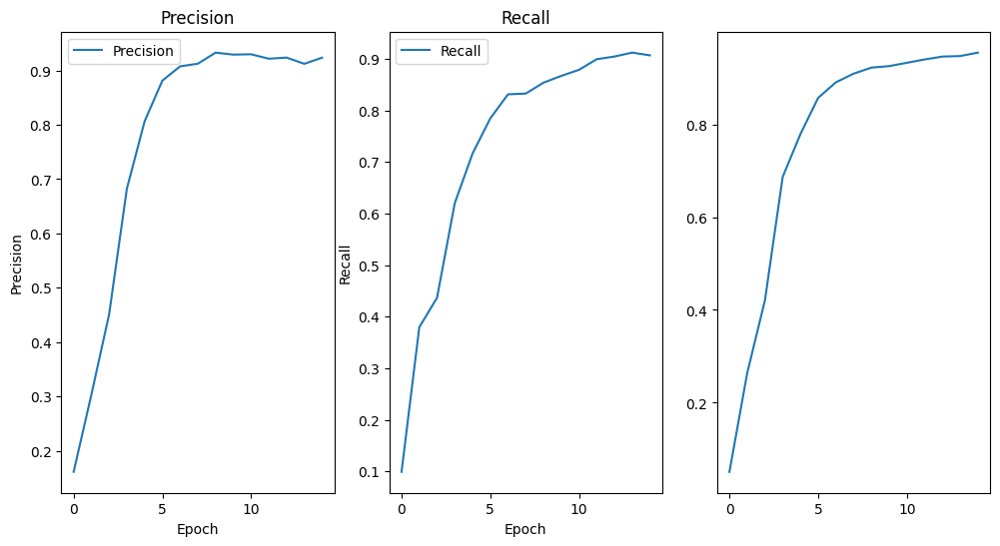

In [76]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to the results.csv file
results_file = '/content/models/research/yolov5/runs/train/exp/results.csv'

# Read the results.csv file
df = pd.read_csv(results_file)

# Strip leading and trailing spaces from column names
df.columns = df.columns.str.strip()

# Display the cleaned column names and the first few rows to verify
print("Cleaned Column Names:")
print(df.columns)

print("\nFirst few rows of the dataframe:")
print(df.head())

# Column names after stripping spaces
epoch_col = 'epoch'
train_box_loss_col = 'train/box_loss'
val_box_loss_col = 'val/box_loss'
train_cls_loss_col = 'train/cls_loss'
val_cls_loss_col = 'val/cls_loss'
precision_col = 'metrics/precision'
recall_col = 'metrics/recall'
map50_col = 'metrics/mAP_0.5'
map5095_col = 'metrics/mAP50-95'

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(df[epoch_col], df[train_box_loss_col], label='Train Box Loss')
plt.plot(df[epoch_col], df[val_box_loss_col], label='Val Box Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Box Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(df[epoch_col], df[train_cls_loss_col], label='Train Class Loss')
plt.plot(df[epoch_col], df[val_cls_loss_col], label='Val Class Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Class Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Plot precision, recall, and mAP
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.plot(df[epoch_col], df[precision_col], label='Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.title('Precision')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df[epoch_col], df[recall_col], label='Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.title('Recall')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df[epoch_col], df[map50_col], label='mAP@0.5')
plt.plot(df[epoch_col], df[map5095_col], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Mean Average Precision')
plt.legend()

plt.tight_layout()
plt.show()


In [72]:
!pwd

/content/models/research/yolov5


#**Test the model**

In [ ]:
!pip install dill

In [ ]:
# Assume the video file is named 'input_video.mp4'
video_path = '/content/multiple-cameras-fall-dataset/dataset/dataset/chute07/cam1.avi'

In [ ]:
!unzip /content/yolov5_best_model.zip -d /content/

unzip:  cannot find or open /content/yolov5_best_model.zip, /content/yolov5_best_model.zip.zip or /content/yolov5_best_model.zip.ZIP.


In [ ]:
!unzip /content/yolo/yolov10/yolov10_best_model.zip -d /content/

Archive:  /content/yolo/yolov10/yolov10_best_model.zip
  inflating: /content/content/yolo/yolov10/runs/detect/train/weights/best.pt  


In [ ]:
import torch
import cv2
from IPython.display import display, Video

# Load the YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/runs/train/exp/weights/best.pt')  # Adjust path if needed

# Function to run inference on a video
def run_inference_on_video(input_video_path, output_video_path):
    # Open the video file
    vid_cap = cv2.VideoCapture(input_video_path)
    if not vid_cap.isOpened():
        raise Exception(f"Cannot open video {input_video_path}")

    # Get video properties
    width  = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = vid_cap.get(cv2.CAP_PROP_FPS)
    total_frames = int(vid_cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    frame_count = 0
    while vid_cap.isOpened():
        ret, frame = vid_cap.read()
        if not ret:
            break

        # Run inference
        results = model(frame)

        # Render the results on the frame
        results.render()
        out.write(frame)

        frame_count += 1
        if frame_count % 100 == 0:
            print(f"Processed {frame_count}/{total_frames} frames")

    # Release resources
    vid_cap.release()
    out.release()

# Path to the input video
video_path = '/content/cam8.avi'  # Make sure this path is correct

# Path to the output video
output_path = '/content/output_video.mp4'

# Run inference on the video
run_inference_on_video(video_path, output_path)

# Display the output video
display(Video(output_path, embed=True))

/usr/local/lib/python3.10/dist-packages/torch/hub.py:293: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2024-6-25 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)



Exception: Can't get attribute 'E2EDetectLoss' on <module 'ultralytics.utils.loss' from '/content/yolo/yolov10/ultralytics/utils/loss.py'>. Cache may be out of date, try `force_reload=True` or see https://docs.ultralytics.com/yolov5/tutorials/pytorch_hub_model_loading for help.

In [ ]:
from google.colab import files
import tensorflow as tf
import numpy as np
import cv2
from object_detection.utils import label_map_util, visualization_utils as viz_utils
import torch
import os
from IPython.display import display, Video

# Assume the video file is named 'input_video.mp4'
video_path = '/content/cam1.avi'

!tar -xvzf /content/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz -C /content/

# Load the pre-trained TensorFlow model from TensorFlow Hub
detector = tf.saved_model.load('/content/faster_rcnn_inception_v2_coco_2018_01_28/saved_model')
infer = detector.signatures['serving_default']

# Load label map
path_to_labels = '/content/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(path_to_labels, use_display_name=True)

# Function to preprocess video
def preprocess_video(video_path, output_dir):
    vid_cap = cv2.VideoCapture(video_path)
    if not vid_cap.isOpened():
        raise Exception(f"Cannot open video {video_path}")

    frame_count = int(vid_cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width  = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = vid_cap.get(cv2.CAP_PROP_FPS)

    os.makedirs(output_dir, exist_ok=True)
    frame_idx = 0
    processed_frames = []

    while vid_cap.isOpened():
        ret, frame = vid_cap.read()
        if not ret:
            break

        input_tensor = tf.convert_to_tensor(frame)
        input_tensor = input_tensor[tf.newaxis, ...]
        detections = infer(input_tensor)

        num_detections = int(detections.pop('num_detections'))
        detections = {key: value[0, :num_detections].numpy() for key, value in detections.items()}
        detections['num_detections'] = num_detections
        detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

        viz_utils.visualize_boxes_and_labels_on_image_array(
            frame,
            detections['detection_boxes'],
            detections['detection_classes'],
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=200,
            min_score_thresh=0.5,
            agnostic_mode=False)

        output_frame_path = os.path.join(output_dir, f'frame_{frame_idx}.jpg')
        cv2.imwrite(output_frame_path, frame)
        processed_frames.append(output_frame_path)
        frame_idx += 1

        if frame_idx % 100 == 0:
            print(f"Processed {frame_idx}/{frame_count} frames")

    vid_cap.release()
    return processed_frames, width, height, fps

# Preprocess the video
processed_frames, width, height, fps = preprocess_video(video_path, '/content/processed_frames')

# Load the YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/runs/train/exp/weights/best.pt')  # Adjust path if needed

# Function to run YOLOv5 on preprocessed frames
def run_yolo_on_frames(frames, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    yolo_processed_frames = []

    for frame_path in frames:
        frame = cv2.imread(frame_path)
        results = model(frame)
        results.render()
        output_frame_path = os.path.join(output_dir, os.path.basename(frame_path))
        cv2.imwrite(output_frame_path, frame)
        yolo_processed_frames.append(output_frame_path)

    return yolo_processed_frames

# Run YOLOv5 on the preprocessed frames
yolo_processed_frames = run_yolo_on_frames(processed_frames, '/content/yolo_processed_frames')

# Create the output video
def create_video_from_frames(frame_paths, output_video_path, fps, width, height):
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    for frame_path in frame_paths:
        frame = cv2.imread(frame_path)
        out.write(frame)

    out.release()

output_video_path = '/content/output_videos.mp4'
create_video_from_frames(yolo_processed_frames, output_video_path, fps, width, height)

# Display the output video
display(Video(output_video_path, embed=True))

faster_rcnn_inception_v2_coco_2018_01_28/
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.index
faster_rcnn_inception_v2_coco_2018_01_28/checkpoint
faster_rcnn_inception_v2_coco_2018_01_28/pipeline.config
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.meta
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/saved_model.pb
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/variables/
faster_rcnn_inception_v2_coco_2018_01_28/frozen_inference_graph.pb
Processed 100/1562 frames
Processed 200/1562 frames
Processed 300/1562 frames
Processed 400/1562 frames
Processed 500/1562 frames
Processed 600/1562 frames
Processed 700/1562 frames
Processed 800/1562 frames
Processed 900/1562 frames
Processed 1000/1562 frames
Processed 1100/1562 frames
Processed 1200/1562 frames
Processed 1300/1562 frames
Processed 1400/1562 frames
Processed 1500/1562 frames


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-6-20 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [ ]:
from google.colab import files
import tensorflow as tf
import numpy as np
import cv2
from object_detection.utils import label_map_util, visualization_utils as viz_utils
import torch
import os
from IPython.display import display, Video

# Assume the video file is named 'input_video.mp4'
video_path = '/content/cam8.avi'

# Unzip the model archive if not already done
!tar -xvzf /content/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz -C /content/

# Load the pre-trained TensorFlow model from TensorFlow Hub
detector = tf.saved_model.load('/content/faster_rcnn_inception_v2_coco_2018_01_28/saved_model')
infer = detector.signatures['serving_default']

!unzip /content/yolov5_best_model.zip -d /content/

# Load label map
path_to_labels = '/content/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(path_to_labels, use_display_name=True)

# Function to preprocess video
def preprocess_video(video_path, output_dir):
    vid_cap = cv2.VideoCapture(video_path)
    if not vid_cap.isOpened():
        raise Exception(f"Cannot open video {video_path}")

    frame_count = int(vid_cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width  = int(vid_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(vid_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = vid_cap.get(cv2.CAP_PROP_FPS)

    os.makedirs(output_dir, exist_ok=True)
    frame_idx = 0
    processed_frames = []

    while vid_cap.isOpened():
        ret, frame = vid_cap.read()
        if not ret:
            break

        input_tensor = tf.convert_to_tensor(frame)
        input_tensor = input_tensor[tf.newaxis, ...]
        detections = infer(input_tensor)

        num_detections = int(detections.pop('num_detections'))
        detections = {key: value[0, :num_detections].numpy() for key, value in detections.items()}
        detections['num_detections'] = num_detections
        detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

        viz_utils.visualize_boxes_and_labels_on_image_array(
            frame,
            detections['detection_boxes'],
            detections['detection_classes'],
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=200,
            min_score_thresh=0.5,
            agnostic_mode=False)

        output_frame_path = os.path.join(output_dir, f'frame_{frame_idx}.jpg')
        cv2.imwrite(output_frame_path, frame)
        processed_frames.append(output_frame_path)
        frame_idx += 1

        if frame_idx % 100 == 0:
            print(f"Processed {frame_idx}/{frame_count} frames")

    vid_cap.release()
    return processed_frames, width, height, fps

# Preprocess the video
processed_frames, width, height, fps = preprocess_video(video_path, '/content/processed_frames')

# Load the YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/yolo/yolov10/runs/detect/train/weights/best.pt')  # Adjust path if needed

# Function to run YOLOv5 on preprocessed frames
def run_yolo_on_frames(frames, output_dir):
    os.makedirs(output_dir, exist_ok=True)
    yolo_processed_frames = []

    for frame_path in frames:
        frame = cv2.imread(frame_path)
        results = model(frame)
        results.render()

        # Initialize label and confidence score for top-left display
        display_label = None

        # Get the class label for the detection
        for *xyxy, conf, cls in results.xyxy[0].cpu().numpy():
            label = int(cls)
            class_label = 'Fall' if label == 0 else 'No Fall'
            display_label = f'{class_label} {conf:.2f}'

        # Display the label on the frame at top-left corner if any detection exists
        if display_label:
            cv2.putText(frame, display_label, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, lineType=cv2.LINE_AA)

        output_frame_path = os.path.join(output_dir, os.path.basename(frame_path))
        cv2.imwrite(output_frame_path, frame)
        yolo_processed_frames.append(output_frame_path)

    return yolo_processed_frames

# Run YOLOv5 on the preprocessed frames
yolo_processed_frames = run_yolo_on_frames(processed_frames, '/content/yolo_processed_frames')

# Create the output video
def create_video_from_frames(frame_paths, output_video_path, fps, width, height):
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

    for frame_path in frame_paths:
        frame = cv2.imread(frame_path)
        out.write(frame)

    out.release()

output_video_path = '/content/outputed_video.mp4'
create_video_from_frames(yolo_processed_frames, output_video_path, fps, width, height)

# Display the output video
display(Video(output_video_path, embed=True))

# Download the video
files.download(output_video_path)


faster_rcnn_inception_v2_coco_2018_01_28/
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.index
faster_rcnn_inception_v2_coco_2018_01_28/checkpoint
faster_rcnn_inception_v2_coco_2018_01_28/pipeline.config
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.meta
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/saved_model.pb
faster_rcnn_inception_v2_coco_2018_01_28/saved_model/variables/
faster_rcnn_inception_v2_coco_2018_01_28/frozen_inference_graph.pb
Archive:  /content/yolov5_best_model.zip
replace /content/runs/train/exp/weights/best.pt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: /content/runs/train/exp/weights/best.pt  
Processed 100/5350 frames
Processed 200/5350 frames
Processed 300/5350 frames
Processed 400/5350 frames
Processed 500/5350 frames
Processed 600/5350 frames
Processed 700/5350 frames
Processed 800/5350 frames
Processed 900/53

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-6-20 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


YOLOv10

In [ ]:
# Install the necessary libraries
!pip install ultralytics

In [ ]:
import pandas as pd
import os
from ultralytics import YOLO
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import cv2
import numpy as np